<a href="https://colab.research.google.com/github/J-N-ch/RL_MAZE/blob/master/RL_maze.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Modification from "https://github.com/YutaroOgawa/Deep-Reinforcement-Learning-Book/blob/master/program/2_2_maze_random.ipynb"
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

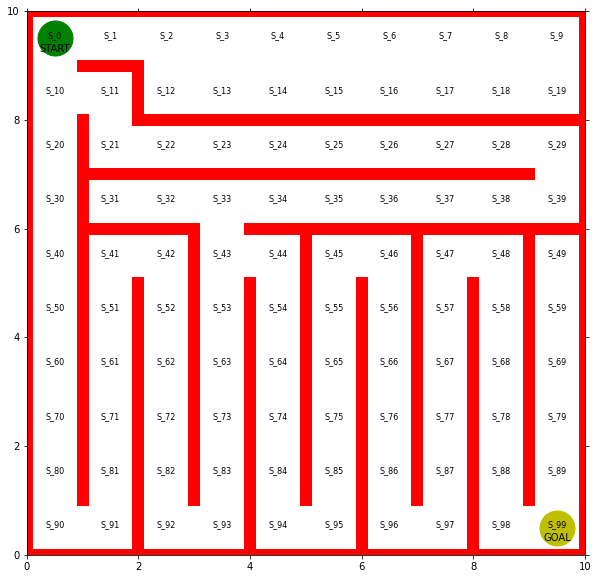

In [ ]:
# Initialize State of Maze

# Set the size of the Graph
fig = plt.figure( figsize=(10, 10) )
ax  = plt.gca()

# Draw the Red Wall
# [x1, y1] ---> [x2, y2]
#plt.plot([x1, x2], [y1, y2], color='red', linewidth=2)
lwd=12
plt.plot([  0, 0 ], [  0, 10 ], color='red', linewidth=lwd)
plt.plot([  0,10 ], [ 10, 10 ], color='red', linewidth=lwd)
plt.plot([ 10,10 ], [ 10,  0 ], color='red', linewidth=lwd)
plt.plot([ 10, 0 ], [  0,  0 ], color='red', linewidth=lwd)

plt.plot([1, 1    ], [ 1,     1 + 7], color='red', linewidth=lwd)
plt.plot([1, 2    ], [ 2 + 7, 2 + 7], color='red', linewidth=lwd)
plt.plot([2, 2    ], [ 2 + 7, 1 + 7], color='red', linewidth=lwd)
plt.plot([2, 3 + 7], [ 1 + 7, 1 + 7], color='red', linewidth=lwd)
plt.plot([1, 3    ], [-1 + 7,-1 + 7], color='red', linewidth=lwd)
plt.plot([4, 10   ], [-1 + 7,-1 + 7], color='red', linewidth=lwd)
plt.plot([1, 9    ], [ 0 + 7, 0 + 7], color='red', linewidth=lwd)
plt.plot([2, 2    ], [ 0,    -2 + 7], color='red', linewidth=lwd)
plt.plot([3, 3    ], [ 1,    -1 + 7], color='red', linewidth=lwd)
plt.plot([4, 4    ], [ 0,    -2 + 7], color='red', linewidth=lwd)
plt.plot([5, 5    ], [ 1,    -1 + 7], color='red', linewidth=lwd)
plt.plot([6, 6    ], [ 0,    -2 + 7], color='red', linewidth=lwd)
plt.plot([7, 7    ], [ 1,    -1 + 7], color='red', linewidth=lwd)
plt.plot([8, 8    ], [ 0,    -2 + 7], color='red', linewidth=lwd)
plt.plot([9, 9    ], [ 1,    -1 + 7], color='red', linewidth=lwd)



# Draw the text to represent state of agent in the maze
def plot_fun(i,j):
    plt.text(i+0.5, (9-j)+0.5, 'S_{}'.format(i + j*10), size=8, ha='center')

[[plot_fun(i,j) for i in range(10)] for j in range(10)]

# Set the range of the graph
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
plt.tick_params(axis='both',
                which='both',
                bottom='off',
                top='off',
                labelbottom='off',
                right='off',
                left='off',
                labelleft='off',
                )

# Draw it!
start_x, start_y = [1 - 0.5, 10 - 0.5]
plt.text(start_x, start_y - 0.25, 'START', ha='center')
plt.text(start_y, start_x - 0.25,  'GOAL', ha='center')
line, =ax.plot([start_x], [start_y], marker="o", color='g', markersize=35)
line, =ax.plot([start_y], [start_x], marker="o", color='y', markersize=35)


In [ ]:
# Set the Strategy parameters theta_0 (The Strategy Table)
N = np.nan
#                 up, right, down, left
theta_0_row9 = np.array([
                    [ N, 1, 1, N],# S_0
                    [ N, 1, N, 1],# S_1
                    [ N, 1, 1, 1],# S_2
                    [ N, 1, 1, 1],# S_3
                    [ N, 1, 1, 1],# S_4
                    [ N, 1, 1, 1],# S_5
                    [ N, 1, 1, 1],# S_6
                    [ N, 1, 1, 1],# S_7
                    [ N, 1, 1, 1],# S_8
                    [ N, N, 1, 1],# S_9
                   ])

theta_0_row8 = np.array([
                    [ 1, 1, 1, N],# S_10
                    [ N, N, 1, 1],# S_11
                    [ 1, 1, N, N],# S_12
                    [ 1, 1, N, 1],# S_13
                    [ 1, 1, N, 1],# S_14
                    [ 1, 1, N, 1],# S_15
                    [ 1, 1, N, 1],# S_16
                    [ 1, 1, N, 1],# S_17
                    [ 1, 1, N, 1],# S_18
                    [ 1, N, N, 1],# S_19
                   ])

theta_0_row7 = np.array([
                    [ 1, N, 1, N],# S_20
                    [ 1, 1, N, N],# S_21
                    [ N, 1, N, 1],# S_22
                    [ N, 1, N, 1],# S_23
                    [ N, 1, N, 1],# S_24
                    [ N, 1, N, 1],# S_25
                    [ N, 1, N, 1],# S_26
                    [ N, 1, N, 1],# S_27
                    [ N, 1, N, 1],# S_28
                    [ N, N, 1, 1],# S_29
                   ])

theta_0_row6 = np.array([
                    [ 1, N, 1, N],# S_30
                    [ N, 1, N, N],# S_31
                    [ N, 1, N, 1],# S_32
                    [ N, 1, 1, 1],# S_33
                    [ N, 1, N, 1],# S_34
                    [ N, 1, N, 1],# S_35
                    [ N, 1, N, 1],# S_36
                    [ N, 1, N, 1],# S_37
                    [ N, 1, N, 1],# S_38
                    [ 1, N, N, 1],# S_39
                   ])

theta_0_row5 = np.array([
                    [ 1, N, 1, N],# S_40
                    [ N, 1, 1, N],# S_41
                    [ N, N, 1, 1],# S_42
                    [ 1, 1, 1, N],# S_43
                    [ N, N, 1, 1],# S_44
                    [ N, 1, 1, N],# S_45
                    [ N, N, 1, 1],# S_46
                    [ N, 1, 1, N],# S_47
                    [ N, N, 1, 1],# S_48
                    [ N, N, 1, N],# S_49
                   ])

theta_0_row4 = np.array([
                    [ 1, N, 1, N],# S_50
                    [ 1, N, 1, N],# S_51
                    [ 1, N, 1, N],# S_52
                    [ 1, N, 1, N],# S_53
                    [ 1, N, 1, N],# S_54
                    [ 1, N, 1, N],# S_55
                    [ 1, N, 1, N],# S_56
                    [ 1, N, 1, N],# S_57
                    [ 1, N, 1, N],# S_58
                    [ 1, N, 1, N],# S_59
                   ])

theta_0_row3 = np.array([
                    [ 1, N, 1, N],# S_60
                    [ 1, N, 1, N],# S_61
                    [ 1, N, 1, N],# S_62
                    [ 1, N, 1, N],# S_63
                    [ 1, N, 1, N],# S_64
                    [ 1, N, 1, N],# S_65
                    [ 1, N, 1, N],# S_66
                    [ 1, N, 1, N],# S_67
                    [ 1, N, 1, N],# S_68
                    [ 1, N, 1, N],# S_69
                   ])

theta_0_row2 = np.array([
                    [ 1, N, 1, N],# S_70
                    [ 1, N, 1, N],# S_71
                    [ 1, N, 1, N],# S_72
                    [ 1, N, 1, N],# S_73
                    [ 1, N, 1, N],# S_74
                    [ 1, N, 1, N],# S_75
                    [ 1, N, 1, N],# S_76
                    [ 1, N, 1, N],# S_77
                    [ 1, N, 1, N],# S_78
                    [ 1, N, 1, N],# S_79
                   ])

theta_0_row1 = np.array([
                    [ 1, N, 1, N],# S_80
                    [ 1, N, 1, N],# S_81
                    [ 1, N, 1, N],# S_82
                    [ 1, N, 1, N],# S_83
                    [ 1, N, 1, N],# S_84
                    [ 1, N, 1, N],# S_85
                    [ 1, N, 1, N],# S_86
                    [ 1, N, 1, N],# S_87
                    [ 1, N, 1, N],# S_88
                    [ 1, N, 1, N],# S_89
                   ])

theta_0_row0 = np.array([
                    [ 1, 1, N, N],# S_90
                    [ 1, N, N, 1],# S_91
                    [ 1, 1, N, N],# S_92
                    [ 1, N, N, 1],# S_93
                    [ 1, 1, N, N],# S_94
                    [ 1, N, N, 1],# S_95
                    [ 1, 1, N, N],# S_96
                    [ 1, N, N, 1],# S_97
                    [ 1, 1, N, N],# S_98
                    [ 1, N, N, 1],# S_99
                   ])

theta_0 = np.concatenate([
                    theta_0_row9,
                    theta_0_row8,
                    theta_0_row7,
                    theta_0_row6,
                    theta_0_row5,
                    theta_0_row4,
                    theta_0_row3,
                    theta_0_row2,
                    theta_0_row1,
                    theta_0_row0,
                   ])

theta_0

array([[nan,  1.,  1., nan],
       [nan,  1., nan,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  1.,  1.,  1.],
       [nan, nan,  1.,  1.],
       [ 1.,  1.,  1., nan],
       [nan, nan,  1.,  1.],
       [ 1.,  1., nan, nan],
       [ 1.,  1., nan,  1.],
       [ 1.,  1., nan,  1.],
       [ 1.,  1., nan,  1.],
       [ 1.,  1., nan,  1.],
       [ 1.,  1., nan,  1.],
       [ 1.,  1., nan,  1.],
       [ 1., nan, nan,  1.],
       [ 1., nan,  1., nan],
       [ 1.,  1., nan, nan],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan,  1., nan,  1.],
       [nan, nan,  1.,  1.],
       [ 1., nan,  1., nan],
       [nan,  1., nan, nan],
       [nan,  1., nan,  1.],
       [nan,  1.,  1.,  1.],
       [nan,  

In [ ]:
def simple_convert_into_pi_from_theta(theta):

    [m,n] = theta.shape
    pi = np.zeros((m, n))

    for i in range(0, m):
        pi[i, :] = theta[i, :] / np.nansum(theta[i, :])

    pi = np.nan_to_num(pi)

    return pi
      

In [ ]:
pi_0 = simple_convert_into_pi_from_theta(theta_0)

pi_0

array([[0.        , 0.5       , 0.5       , 0.        ],
       [0.        , 0.5       , 0.        , 0.5       ],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.33333333, 0.33333333, 0.33333333],
       [0.        , 0.        , 0.5       , 0.5       ],
       [0.33333333, 0.33333333, 0.33333333, 0.        ],
       [0.        , 0.        , 0.5       , 0.5       ],
       [0.5       , 0.5       , 0.        , 0.        ],
       [0.33333333, 0.33333333, 0.        , 0.33333333],
       [0.33333333, 0.33333333, 0.        , 0.33333333],
       [0.33333333, 0.33333333, 0.        , 0.33333333],
       [0.33333333, 0.33333333, 0.        , 0.33333333],
       [0.33333333, 0.33333333,

In [ ]:
# Get Next Stage

def get_next_s(pi, s):
    direction = ["up", "right", "down", "left"]

    # Choose the direction according to the probability of pi[s,:]
    next_direction = np.random.choice(direction, p=pi[s,:])

    if   next_direction == "up":
        s_next = s - 10
    elif next_direction == "right":
        s_next = s + 1
    elif next_direction == "down":
        s_next = s + 10
    elif next_direction == "left":
        s_next = s - 1

    return s_next


In [ ]:
def goal_maze(pi):
    s = 0 # At the starting point
    state_history = [0]

    while True:
        next_s = get_next_s(pi, s)
        state_history.append(next_s)

        if next_s == 99:
            break
        else:
            s = next_s

    return state_history
 

In [20]:

while True:
    state_history = goal_maze(pi_0)
    print("The total steps used to finish the maze is " + str(len(state_history)-1))
    if( len(state_history)-1 < 500): 
        break


The total steps used to finish the maze is 3732
The total steps used to finish the maze is 1976
The total steps used to finish the maze is 3830
The total steps used to finish the maze is 1228
The total steps used to finish the maze is 3020
The total steps used to finish the maze is 1884
The total steps used to finish the maze is 8634
The total steps used to finish the maze is 6830
The total steps used to finish the maze is 3638
The total steps used to finish the maze is 4672
The total steps used to finish the maze is 4436
The total steps used to finish the maze is 8490
The total steps used to finish the maze is 712
The total steps used to finish the maze is 4912
The total steps used to finish the maze is 1488
The total steps used to finish the maze is 8602
The total steps used to finish the maze is 5086
The total steps used to finish the maze is 6944
The total steps used to finish the maze is 3218
The total steps used to finish the maze is 11660
The total steps used to finish the maze 

In [21]:
state_history_cutted = state_history
#state_history_cutted = state_history[0:1267]
print(state_history_cutted)

[0, 10, 0, 10, 0, 10, 20, 30, 40, 50, 40, 50, 60, 50, 60, 50, 60, 50, 40, 50, 60, 50, 60, 70, 80, 70, 80, 90, 91, 81, 71, 81, 91, 90, 91, 81, 71, 61, 51, 41, 51, 41, 51, 61, 51, 41, 42, 52, 62, 52, 42, 52, 62, 72, 82, 92, 93, 92, 82, 92, 93, 83, 73, 83, 93, 83, 93, 92, 82, 72, 82, 92, 82, 92, 93, 92, 93, 92, 82, 72, 62, 52, 42, 52, 62, 52, 42, 52, 42, 52, 62, 72, 62, 52, 62, 72, 62, 72, 82, 92, 93, 83, 73, 83, 93, 83, 73, 63, 53, 43, 53, 63, 53, 43, 53, 43, 33, 43, 33, 43, 53, 63, 73, 63, 73, 63, 53, 43, 44, 43, 33, 32, 33, 34, 35, 36, 37, 38, 37, 36, 35, 34, 33, 34, 35, 34, 35, 34, 33, 34, 33, 43, 53, 43, 44, 54, 64, 74, 64, 74, 64, 54, 64, 54, 64, 74, 84, 74, 64, 74, 84, 94, 84, 94, 95, 85, 75, 65, 75, 85, 75, 65, 75, 65, 75, 85, 75, 65, 55, 45, 55, 65, 55, 45, 55, 65, 55, 45, 46, 45, 46, 56, 66, 56, 46, 56, 46, 45, 55, 45, 46, 45, 55, 45, 46, 45, 46, 45, 55, 45, 46, 56, 46, 56, 66, 76, 66, 76, 86, 96, 97, 87, 97, 96, 86, 96, 86, 96, 86, 96, 86, 76, 66, 56, 66, 56, 66, 76, 86, 76, 86

In [22]:
# エージェントの移動の様子を可視化します
# 参考URL http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-notebooks/
import matplotlib
from matplotlib import animation, rc
matplotlib.rcParams['animation.embed_limit'] = 2**128

from IPython.display import HTML


def init():
    '''背景画像の初期化'''
    line.set_data([], [])
    return (line,)


def animate(i):
    '''フレームごとの描画内容'''
    state = state_history_cutted[i]  # 現在の場所を描く
    x = (state % 10) + 0.5  # 状態のx座標は、3で割った余り+0.5
    y = 9.5 - int(state / 10)  # y座標は3で割った商を9.5から引く
    line.set_data(x, y)
    return (line,)


#　初期化関数とフレームごとの描画関数を用いて動画を作成する
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(
    state_history), interval=200, repeat=False)

#HTML(anim.to_jshtml())
rc('animation', html='jshtml')
anim